# Slice Preprocessing: Intensity inspection, slicing, select relevant

****************

**<div itemscope itemtype="https://schema.org/Person"><a itemprop="sameAs" content="https://orcid.org/0000-0001-5567-801X" href="https://orcid.org/0000-0001-5567-801X" target="orcid.widget" rel="me noopener noreferrer" style="vertical-align:top;"><img src="https://orcid.org/sites/default/files/images/orcid_16x16.png" style="width:1em;margin-left:0em;"  alt="ORCID iD icon">Adrián Arnaiz-Rodríguez</a></div>**

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Intensity-Inspection---Pixel-Value-Inspection" data-toc-modified-id="Intensity-Inspection---Pixel-Value-Inspection-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Intensity Inspection - Pixel Value Inspection</a></span><ul class="toc-item"><li><span><a href="#Loading-with-vol.dataobj.get_unscaled()" data-toc-modified-id="Loading-with-vol.dataobj.get_unscaled()-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Loading with <code>vol.dataobj.get_unscaled()</code></a></span></li><li><span><a href="#Loading-with-vol.get_fdata()" data-toc-modified-id="Loading-with-vol.get_fdata()-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Loading with <code>vol.get_fdata()</code></a></span></li><li><span><a href="#Comparison" data-toc-modified-id="Comparison-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Comparison</a></span><ul class="toc-item"><li><span><a href="#Original-ranges-an-plot" data-toc-modified-id="Original-ranges-an-plot-1.3.1"><span class="toc-item-num">1.3.1&nbsp;&nbsp;</span>Original ranges an plot</a></span></li><li><span><a href="#Normalization-ranges-an-plots" data-toc-modified-id="Normalization-ranges-an-plots-1.3.2"><span class="toc-item-num">1.3.2&nbsp;&nbsp;</span>Normalization ranges an plots</a></span></li><li><span><a href="#Non-Zero-Normalization-ranges-an-plots" data-toc-modified-id="Non-Zero-Normalization-ranges-an-plots-1.3.3"><span class="toc-item-num">1.3.3&nbsp;&nbsp;</span>Non-Zero Normalization ranges an plots</a></span></li></ul></li><li><span><a href="#Conclussion" data-toc-modified-id="Conclussion-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>Conclussion</a></span></li></ul></li><li><span><a href="#Select-relevant-information" data-toc-modified-id="Select-relevant-information-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Select relevant information</a></span><ul class="toc-item"><li><span><a href="#Analyze-count-Nonzero-pixel-value-distribution" data-toc-modified-id="Analyze-count-Nonzero-pixel-value-distribution-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Analyze count Nonzero pixel value distribution</a></span><ul class="toc-item"><li><span><a href="#Range,-mean-and-quartiles" data-toc-modified-id="Range,-mean-and-quartiles-2.1.1"><span class="toc-item-num">2.1.1&nbsp;&nbsp;</span>Range, mean and quartiles</a></span></li><li><span><a href="#Histogram-distribution-with-outlier-detection-(3std-and-Q1-1.5*IQR)" data-toc-modified-id="Histogram-distribution-with-outlier-detection-(3std-and-Q1-1.5*IQR)-2.1.2"><span class="toc-item-num">2.1.2&nbsp;&nbsp;</span>Histogram distribution with outlier detection (3std and Q1-1.5*IQR)</a></span></li><li><span><a href="#Selecting-only-no-Outliers-(based-on-3std-and-Q1-1.5*IQR)" data-toc-modified-id="Selecting-only-no-Outliers-(based-on-3std-and-Q1-1.5*IQR)-2.1.3"><span class="toc-item-num">2.1.3&nbsp;&nbsp;</span>Selecting only no Outliers (based on 3std and Q1-1.5*IQR)</a></span></li><li><span><a href="#Setting-a-higer-fixed-number-as-limit" data-toc-modified-id="Setting-a-higer-fixed-number-as-limit-2.1.4"><span class="toc-item-num">2.1.4&nbsp;&nbsp;</span>Setting a higer fixed number as limit</a></span></li></ul></li><li><span><a href="#Analyze-mean-Nonzero-pixel-value-distribution" data-toc-modified-id="Analyze-mean-Nonzero-pixel-value-distribution-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Analyze mean Nonzero pixel value distribution</a></span><ul class="toc-item"><li><span><a href="#Distribution-and-descriptive-analytics" data-toc-modified-id="Distribution-and-descriptive-analytics-2.2.1"><span class="toc-item-num">2.2.1&nbsp;&nbsp;</span>Distribution and descriptive analytics</a></span></li><li><span><a href="#Setting-fixed-limit-number" data-toc-modified-id="Setting-fixed-limit-number-2.2.2"><span class="toc-item-num">2.2.2&nbsp;&nbsp;</span>Setting fixed limit number</a></span></li></ul></li></ul></li></ul></div>

In [1]:
import nibabel as nib
import glob
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import collections as col
import pickle as pkl


plt.rcParams['image.cmap'] = 'gray'
nib.__version__

'3.1.1'

In [2]:
files = glob.glob('../IXI-T1/*.gz')
len(files), files[0]

(581, '../IXI-T1\\IXI002-Guys-0828-T1.nii.gz')

In [3]:
file_vol_0 = files[0]
vol_0 = nib.load(file_vol_0)

## Intensity Inspection - Pixel Value Inspection

### Loading with `vol.dataobj.get_unscaled()`

In [4]:
vol_0_np = vol_0.dataobj.get_unscaled()
mins = []
maxs = []
for idx in range(vol_0_np.shape[2]):
    sag_slice = vol_0_np[:,:,idx]
    mins.append(sag_slice.min())
    maxs.append(sag_slice.max())
    datatype = sag_slice.dtype
    
mins = set(mins)
maxs = set(maxs)

In [5]:
len(maxs), min(maxs), max(maxs), datatype

(120, 51, 1068, dtype('<i2'))

### Loading with `vol.get_fdata()`

In [6]:
vol_0_np = vol_0.get_fdata()
mins = []
maxs = []
for idx in range(vol_0_np.shape[2]):
    sag_slice = vol_0_np[:,:,idx]
    mins.append(sag_slice.min())
    maxs.append(sag_slice.max())
    datatype = sag_slice.dtype
    
mins = set(mins)
maxs = set(maxs)
    

In [7]:
len(maxs), min(maxs), max(maxs), datatype

(120, 51.0, 1068.0, dtype('float64'))

### Comparison
#### Original ranges an plot

**Ranges**:
* `dataobj.gat_unscaled`: [0-182] to [0-2177] with type <i2
* `get_fdata`: [0-334.13..] to [0-3996.74..] with type fl64                                                           

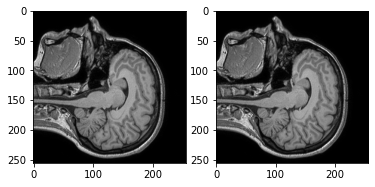

In [8]:
img_do_unscaled = vol_0.dataobj.get_unscaled()[:,:,70]
img_gfdata = vol_0.get_fdata()[:,:,70]
plt.subplot(1,2,1)
plt.imshow(img_do_unscaled)
plt.subplot(1,2,2)
plt.imshow(img_gfdata)

#### Normalization ranges an plots 

In [9]:
norm_img_do_unscaled = (img_do_unscaled - img_do_unscaled.mean()) / img_do_unscaled.std()
norm_img_gfdata = (img_gfdata - img_gfdata.mean()) / img_gfdata.std()
(norm_img_do_unscaled.min(), norm_img_do_unscaled.max()), (norm_img_gfdata.min(), norm_img_gfdata.max()) 

((-0.9662317503936921, 3.3182419259109746),
 (-0.9662317503936921, 3.3182419259109746))

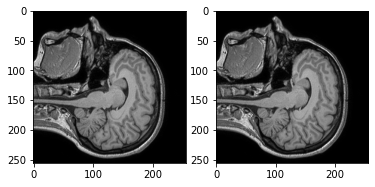

In [10]:
plt.subplot(1,2,1)
plt.imshow(norm_img_do_unscaled)
plt.subplot(1,2,2)
plt.imshow(norm_img_gfdata)

#### Non-Zero Normalization ranges an plots 

In [11]:
norm2_img_do_unscaled = (img_do_unscaled - img_do_unscaled[img_do_unscaled>0].mean()) / img_do_unscaled[img_do_unscaled>0].std()
norm2_img_gfdata = (img_gfdata - img_gfdata[img_gfdata>0].mean()) / img_gfdata[img_gfdata>0].std()
(norm2_img_do_unscaled.min(), norm2_img_do_unscaled.max()), (norm2_img_gfdata.min(), norm2_img_gfdata.max()) 

((-1.3826421709214163, 3.1260234474155646),
 (-1.3826421709214163, 3.1260234474155646))

In [12]:
norm2_img_do_unscaled.dtype, norm2_img_gfdata.dtype

(dtype('float64'), dtype('float64'))

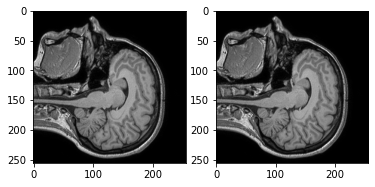

In [13]:
plt.subplot(1,2,1)
plt.imshow(norm2_img_do_unscaled)
plt.subplot(1,2,2)
plt.imshow(norm2_img_gfdata)

### Conclussion

**I does not minf if we load with one method or another. Both methods gives eventually same numpy data after normalization.**

**When we normalize to mean=0 and std=1 we have values from -1 to 4 (aprox)** (depends if we normali¡ze with all values or only with non-zero values)

*****************

## Select relevant information

We will perform a **statistical analysis of nonzero values of all the images to obtain their distribution and select the relevant slices based on these distributions**. From each segment of the data set we will calculate:
* Non-zero values count (in  number of pixels).
* Non-zero mean value (mean value of all non-zero values).

We analyze both distributions and choose a method to eliminate non-relevant sectors based on these distributions. The main objective is to **select a lower limit of nonzero pixels or nonzero pixels mean value** in order to discard irrelevant images (with lots of 0 compared with all the other images)

**For every limit we are going to compare it in a qualitative way**:
* **We will see what slices are selected from volume 0 (easy volume: normal volume)**
* **We will see what slices are selected from volume 5 random volumes**
* **We will see what slices are selected from volume 526 (complicated volume: strange form)**

### Analyze count Nonzero pixel value distribution



In [14]:
df_nonzero_data = pd.DataFrame(columns=['ID', 'NONZERO_COUNT', 'NONZERO_MEAN'])

if False:
    for f in files:
        vol_np = nib.load(f).get_fdata() 
        for id_sag_slice in range(vol_np.shape[2]):
            sag_slice = vol_np[:,:,id_sag_slice]
            non_zero_sag_slice = sag_slice[sag_slice>0]
            #Append data
            df_nonzero_data = df_nonzero_data.append({'ID':f[10:-7]+'_'+str(id_sag_slice),
                                                      'NONZERO_COUNT':len(non_zero_sag_slice),
                                                      'NONZERO_MEAN':non_zero_sag_slice.mean()},
                                                     ignore_index=True)

    df_nonzero_data = df_nonzero_data.astype({'NONZERO_COUNT': 'float64'})
    import pickle as pkl
    with open('nonzero_image_data.pickle', 'wb') as handle:
        pkl.dump(df_nonzero_data, handle)
    
with open('nonzero_image_data.pickle', 'rb') as handle:
    df_nonzero_data = pkl.load(handle)    
            
df_nonzero_data.sample(7)

,ID,NONZERO_COUNT,NONZERO_MEAN
83065,IXI626-Guys-1094-T1_21,39755.0,150.549138
45051,IXI340-IOP-0915-T1_61,60775.0,1844.575977
61949,IXI461-Guys-0998-T1_89,48985.0,237.035623
9433,IXI077-Guys-0752-T1_47,46461.0,669.221287
69083,IXI515-HH-2377-T1_71,59887.0,211.227512
62169,IXI463-IOP-1043-T1_13,34888.0,891.911689
56526,IXI425-IOP-0988-T1_34,40863.0,1199.778626


#### Range, mean and quartiles

In [15]:
df_nonzero_data.describe().round(3)

,NONZERO_COUNT,NONZERO_MEAN
count,86794.000,86794.000
mean,44386.723,352.990
std,8771.458,396.617
min,28.000,1.000
25%,39249.500,131.774
50%,45552.000,229.125
75%,50718.000,283.771
max,64709.000,2040.413


#### Histogram distribution with outlier detection (3std and Q1-1.5*IQR)

It follows a similar Normal distribution: **Negative left skewed distribution - Negative skewness - Right modal**

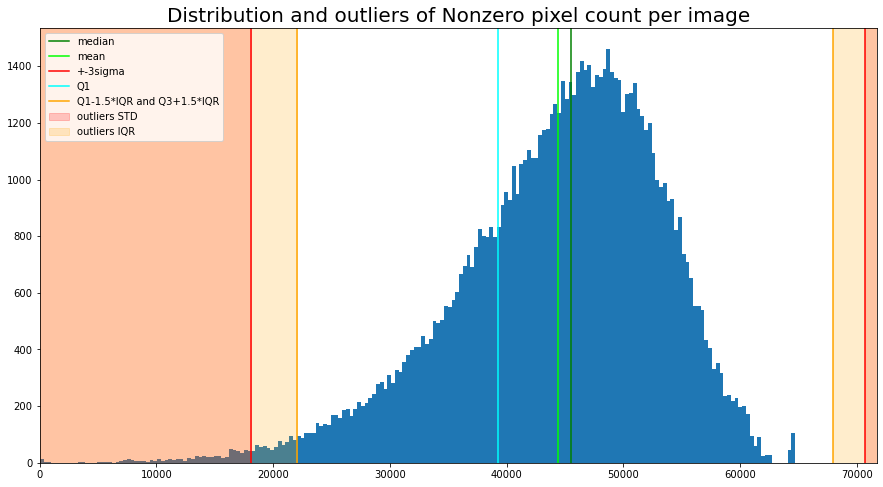

In [16]:
plt.figure(figsize=(15,8))
df_nonzero_data['NONZERO_COUNT'].hist(grid=False, bins=200)

#Outlier limit based on -+3std
mean = np.mean(df_nonzero_data['NONZERO_COUNT'])
std_3 = np.std(df_nonzero_data['NONZERO_COUNT'])*3
lowerstd, upperstd = mean-std_3,mean+std_3

#Outlier limit baserd in IQR
q1 = df_nonzero_data['NONZERO_COUNT'].describe()['25%']
q3 = df_nonzero_data['NONZERO_COUNT'].describe()['75%']
IQR = q3-q1

#Mean and median
plt.axvline(df_nonzero_data['NONZERO_COUNT'].median(), color='green', label='median')
plt.axvline(df_nonzero_data['NONZERO_COUNT'].mean(), color='lime', label='mean')

#Limits of draw
mini = df_nonzero_data['NONZERO_COUNT'].min() if df_nonzero_data['NONZERO_COUNT'].min()<lowerstd else lowerstd+1000
maxi = df_nonzero_data['NONZERO_COUNT'].max() if df_nonzero_data['NONZERO_COUNT'].max()>upperstd else upperstd+1000

#Draw limits and area STD outliers
plt.axvline(lowerstd,color='red', label='+-3sigma')
plt.axvline(upperstd,color='red')
plt.axvspan(mini,lowerstd, color='red',alpha=0.2, label='outliers STD')
plt.axvspan(upperstd,maxi, color='red',alpha=0.2)

#Draw limits and area IQR outliers
plt.axvline(q1,color='cyan', label='Q1')
plt.axvline(q1-1.5*IQR ,color='orange', label='Q1-1.5*IQR and Q3+1.5*IQR')
plt.axvline(q3+1.5*IQR ,color='orange')
plt.axvspan(mini,q1-1.5*IQR, color='orange',alpha=0.2, label='outliers IQR')
plt.axvspan(q3+1.5*IQR,maxi, color='orange',alpha=0.2)


plt.xlim(0,maxi)
plt.legend(loc='upper left')
plt.title('Distribution and outliers of Nonzero pixel count per image', fontsize=20)
plt.show()

#### Selecting only no Outliers (based on 3std and Q1-1.5*IQR)

In [17]:
def show_volume(vol_np, name, lim1, lim2):
    '''
    We show all sagital slices from a volume
    Those which nonzero pixels are lower from lim1 will be orange-framed
    Those which nonzero pixels are lower from lim2 will be red-framed
    lim1>lim2: lim 2 must be more restrictive than lim1
        it measure are number of pixels nonzero    
    '''

    n_slices = vol_np.shape[2]
    images_array = np.moveaxis(vol_np, 2,0)
    
    fig, axes = plt.subplots(int(np.ceil(n_slices/10)), 10, sharex=True, figsize=(15,25), edgecolor='black')
    fig.suptitle(name)

    for i, img in enumerate(images_array):
        axes[i//10][i%10].imshow(img)
        #axes[i//10][i%10].axis('off')
        axes[i//10][i%10].set_yticklabels([])
        axes[i//10][i%10].set_xticklabels([])
        
        count_nonzero_pixels = len(img[img>0])
        
        if count_nonzero_pixels < lim2:
            for spine in axes[i//10][i%10].spines.values():
                spine.set_edgecolor('red')
                spine.set_linewidth(3)
        elif count_nonzero_pixels < lim1:
            for spine in axes[i//10][i%10].spines.values():
                spine.set_edgecolor('orange')
                spine.set_linewidth(3)

    plt.show()

In [18]:
lower_limit_std = lowerstd
lower_limit_IQR = q1-1.5*IQR

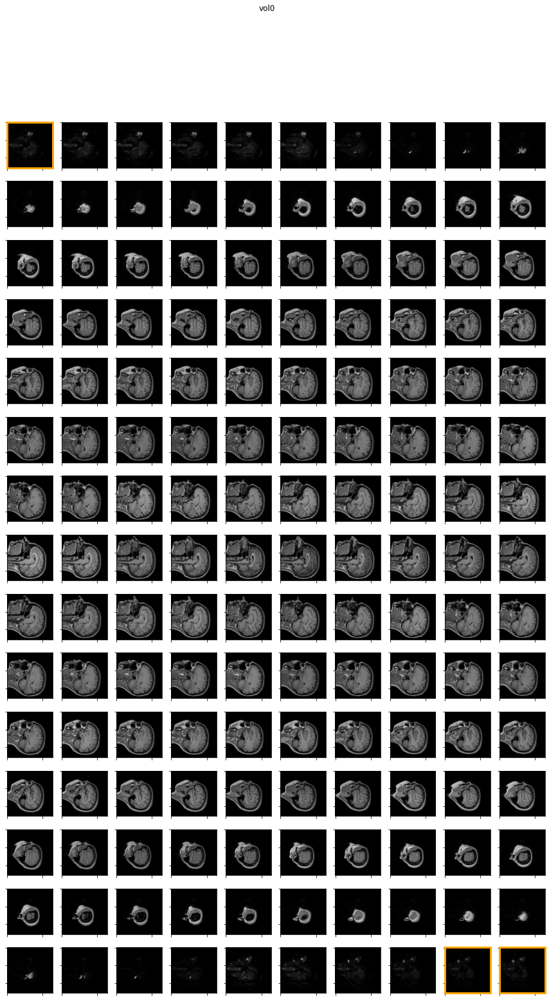

In [19]:
show_volume(vol_0_np, 'vol0', lower_limit_IQR, lower_limit_std)

**As we can see, obviously the limit is too low: lots of images with no relevant information are selected**

#### Setting a higer fixed number as limit

We show the volume 0

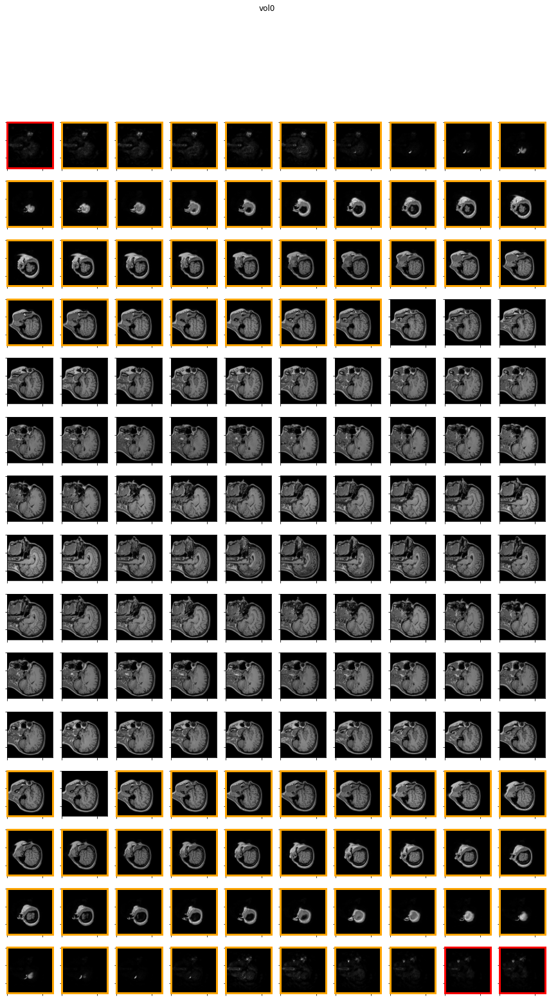

In [20]:
show_volume(vol_0_np, 'vol0', df_nonzero_data['NONZERO_COUNT'].quantile(0.25), lower_limit_IQR)

***We show 6 random volumes***

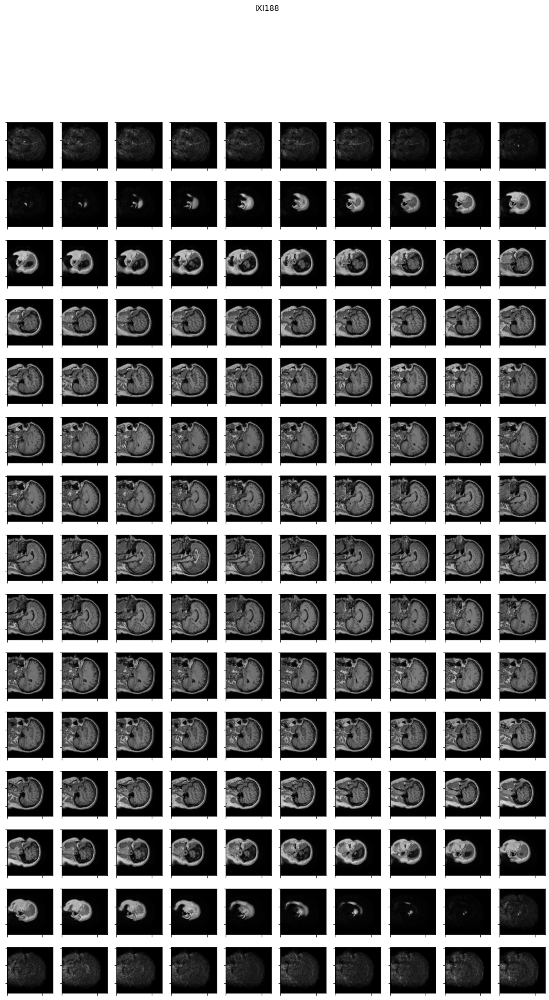

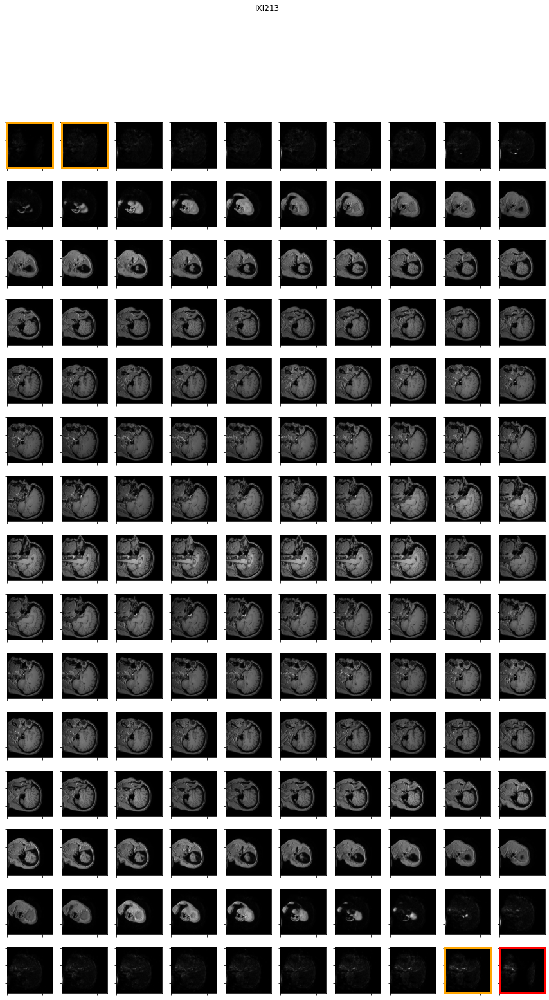

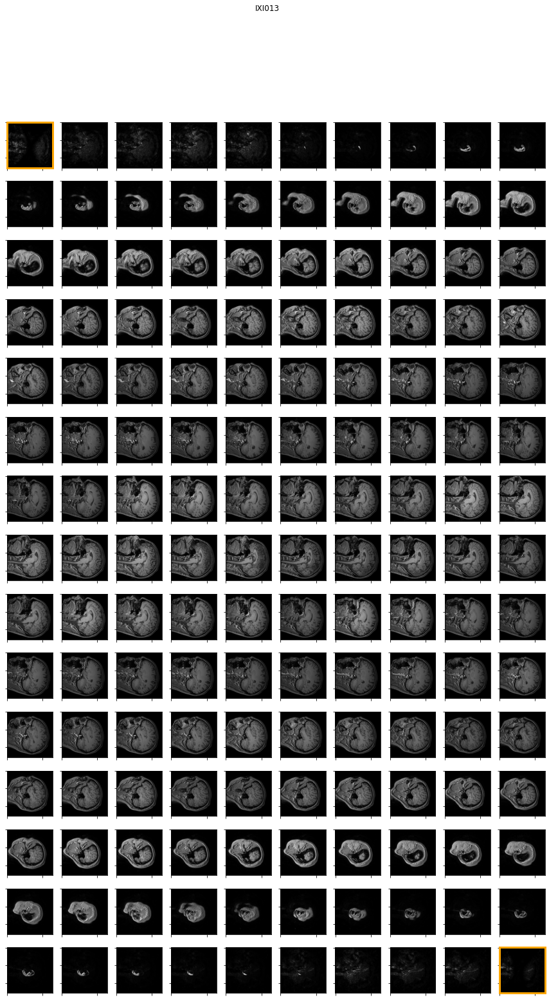

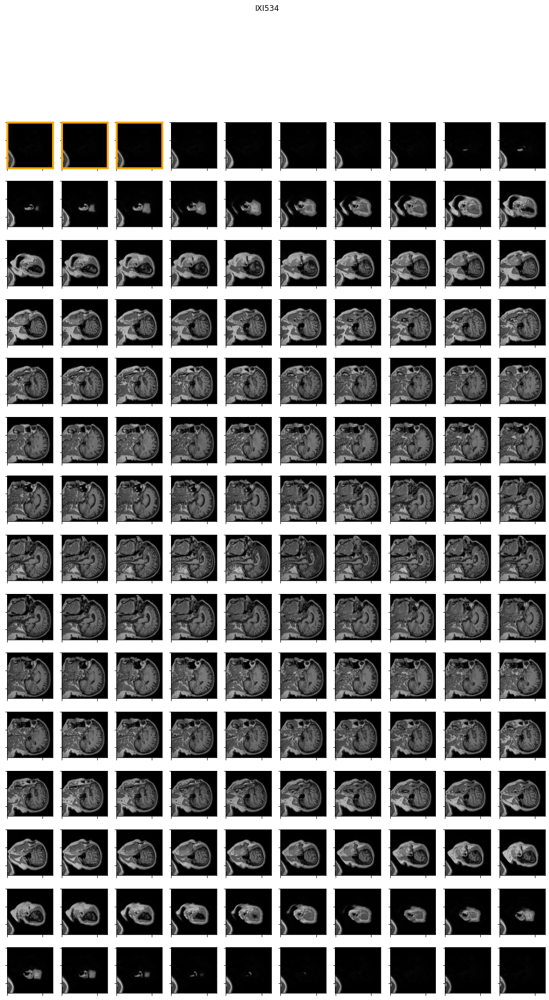

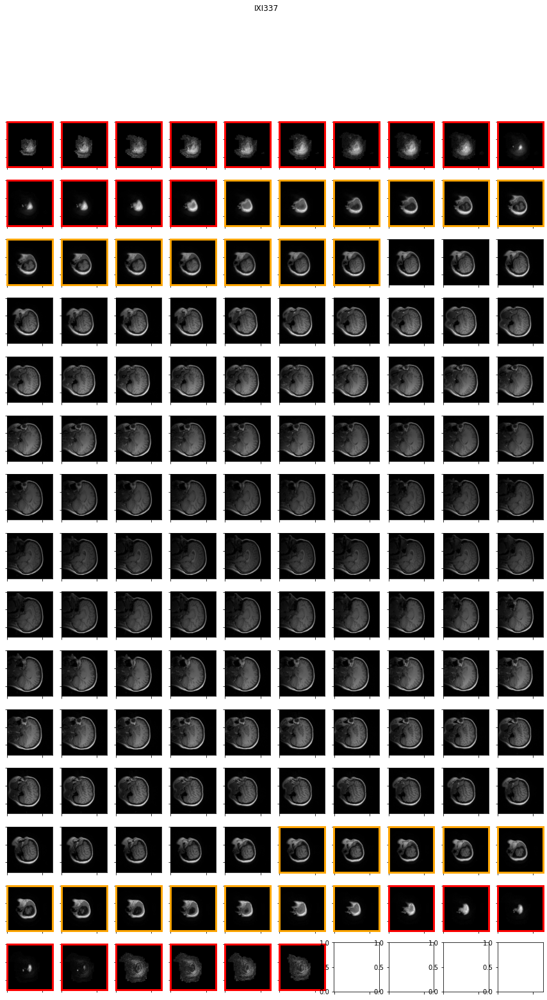

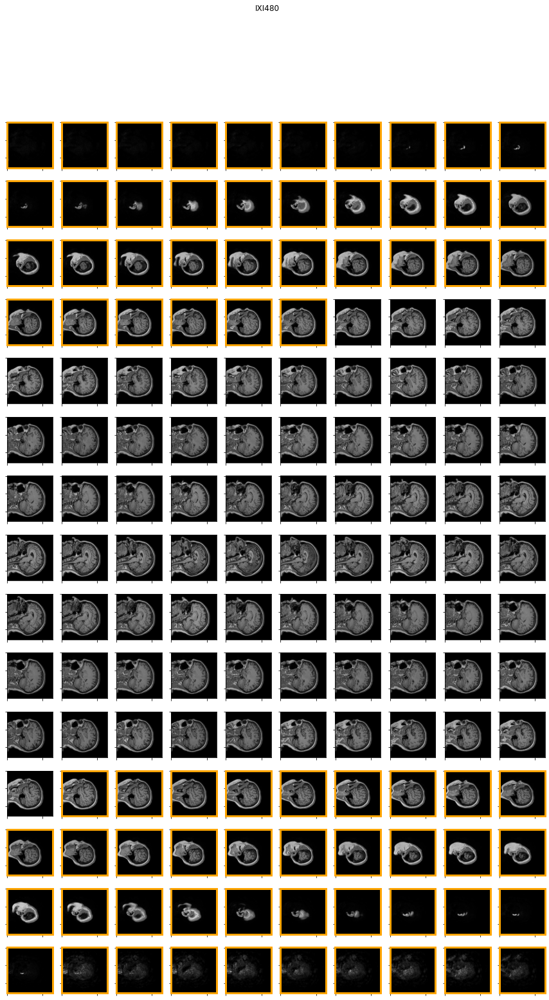

In [21]:
random_vols = np.random.choice(files,6)
for f in random_vols:
    vol_np = nib.load(f).get_fdata()
    show_volume(vol_np, f[10:16], df_nonzero_data['NONZERO_COUNT'].quantile(0.25), 25000)

***We show the behaviour in the complicated volume***

In [22]:
vol_526_np = nib.load('../IXI-T1\IXI526-HH-2392-T1.nii.gz').get_fdata()

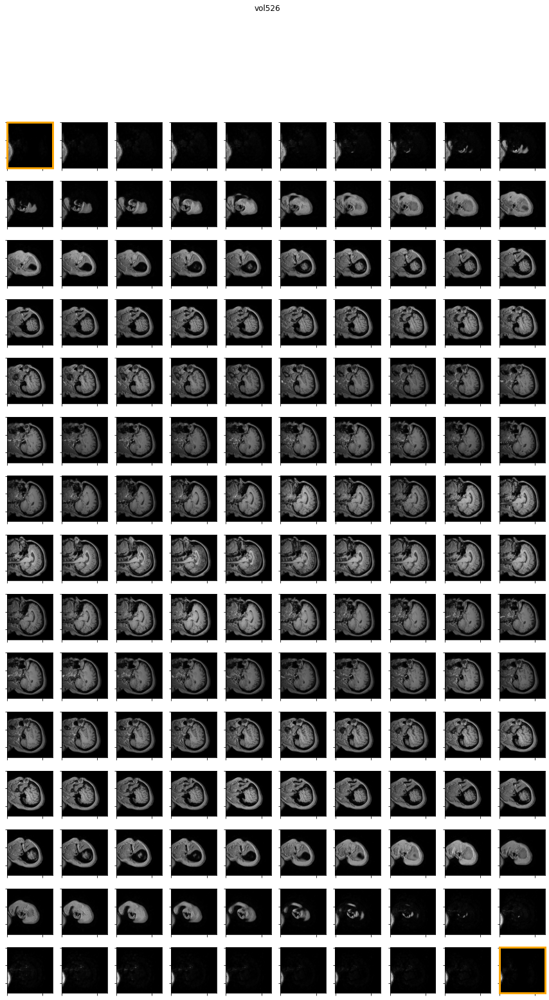

In [23]:
show_volume(vol_526_np, 'vol526', df_nonzero_data['NONZERO_COUNT'].quantile(0.25), 25000)

### Analyze mean Nonzero pixel value distribution

#### Distribution and descriptive analytics

In [24]:
df_nonzero_data['NONZERO_MEAN'].describe()

count    86794.000000
mean       352.990082
std        396.616919
min          1.000000
25%        131.774399
50%        229.124752
75%        283.770950
max       2040.412922
Name: NONZERO_MEAN, dtype: float64

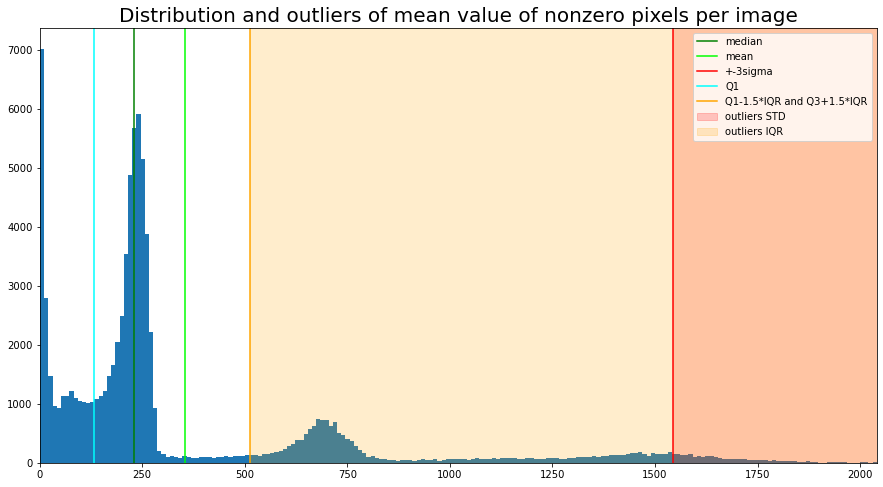

In [25]:
plt.figure(figsize=(15,8))
df_nonzero_data['NONZERO_MEAN'].hist(grid=False, bins=200)

#Outlier limit based on -+3std
mean = np.mean(df_nonzero_data['NONZERO_MEAN'])
std_3 = np.std(df_nonzero_data['NONZERO_MEAN'])*3
lowerstd, upperstd = mean-std_3,mean+std_3

#Outlier limit baserd in IQR
q1 = df_nonzero_data['NONZERO_MEAN'].describe()['25%']
q3 = df_nonzero_data['NONZERO_MEAN'].describe()['75%']
IQR = q3-q1

#Mean and median
plt.axvline(df_nonzero_data['NONZERO_MEAN'].median(), color='green', label='median')
plt.axvline(df_nonzero_data['NONZERO_MEAN'].mean(), color='lime', label='mean')

#Limits of draw
mini = df_nonzero_data['NONZERO_MEAN'].min() if df_nonzero_data['NONZERO_MEAN'].min()<lowerstd else lowerstd
maxi = df_nonzero_data['NONZERO_MEAN'].max() if df_nonzero_data['NONZERO_MEAN'].max()>upperstd else upperstd

#Draw limits and area STD outliers
plt.axvline(lowerstd,color='red', label='+-3sigma')
plt.axvline(upperstd,color='red')
plt.axvspan(mini,lowerstd, color='red',alpha=0.2, label='outliers STD')
plt.axvspan(upperstd,maxi, color='red',alpha=0.2)

#Draw limits and area IQR outliers
plt.axvline(q1,color='cyan', label='Q1')
plt.axvline(q1-1.5*IQR ,color='orange', label='Q1-1.5*IQR and Q3+1.5*IQR')
plt.axvline(q3+1.5*IQR ,color='orange')
plt.axvspan(mini,q1-1.5*IQR, color='orange',alpha=0.2, label='outliers IQR')
plt.axvspan(q3+1.5*IQR,maxi, color='orange',alpha=0.2)


plt.xlim(0,maxi)
plt.legend(loc='upper right')
plt.title('Distribution and outliers of mean value of nonzero pixels per image', fontsize=20)
plt.show()

**As we can see, this is a very strange distribution**

**In order to detect the lower limit, we DO not use the standard deviation or IQR**

**However, we will use fixed values like Q1 or similar**

#### Setting fixed limit number

In [26]:
def show_volume2(vol_np, name, lim1, lim2):
    '''
    We show all sagital slices from a volume
    Those which mean value of nonzero pixels are lower from lim1 will be orange-framed
    Those which mean value of nonzero pixels are lower from lim2 will be red-framed
    lim1>lim2: lim 2 must be more restrictive than lim1
        it measure are mean of values of pixels nonzero    
    '''

    n_slices = vol_np.shape[2]
    images_array = np.moveaxis(vol_np, 2,0)
    
    fig, axes = plt.subplots(int(np.ceil(n_slices/10)), 10, sharex=True, figsize=(15,25), edgecolor='black')
    fig.suptitle(name)

    for i, img in enumerate(images_array):
        axes[i//10][i%10].imshow(img)
        #axes[i//10][i%10].axis('off')
        axes[i//10][i%10].set_yticklabels([])
        axes[i//10][i%10].set_xticklabels([])
        
        mean_nonzero_pixels = img[img>0].mean()
        
        if mean_nonzero_pixels < lim2:
            for spine in axes[i//10][i%10].spines.values():
                spine.set_edgecolor('red')
                spine.set_linewidth(3)
        elif mean_nonzero_pixels < lim1:
            for spine in axes[i//10][i%10].spines.values():
                spine.set_edgecolor('orange')
                spine.set_linewidth(3)

    plt.show()

***We show volume IXI 002***

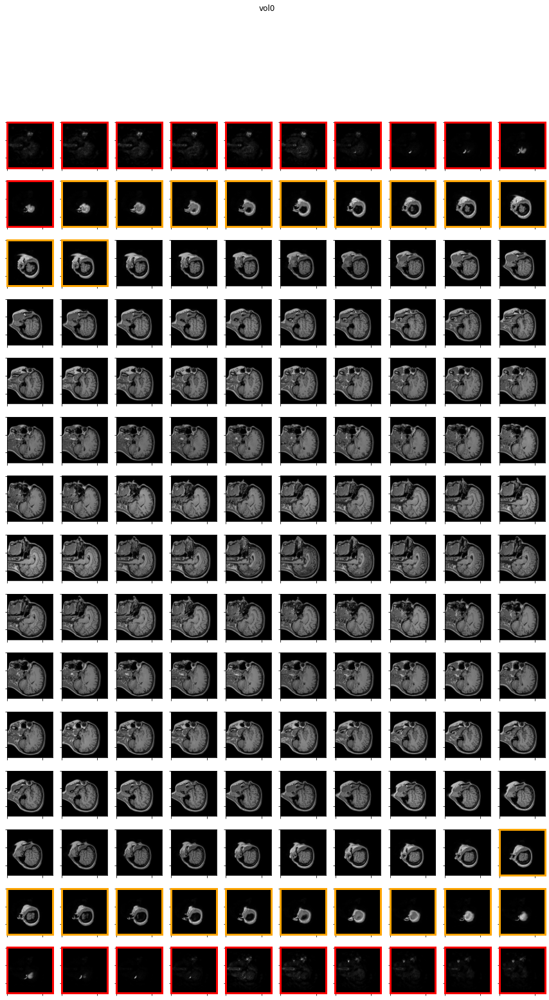

In [27]:
show_volume2(vol_0_np, 'vol0', df_nonzero_data['NONZERO_MEAN'].quantile(0.25), 30)

***We show the behaviour in 5 random volumes***

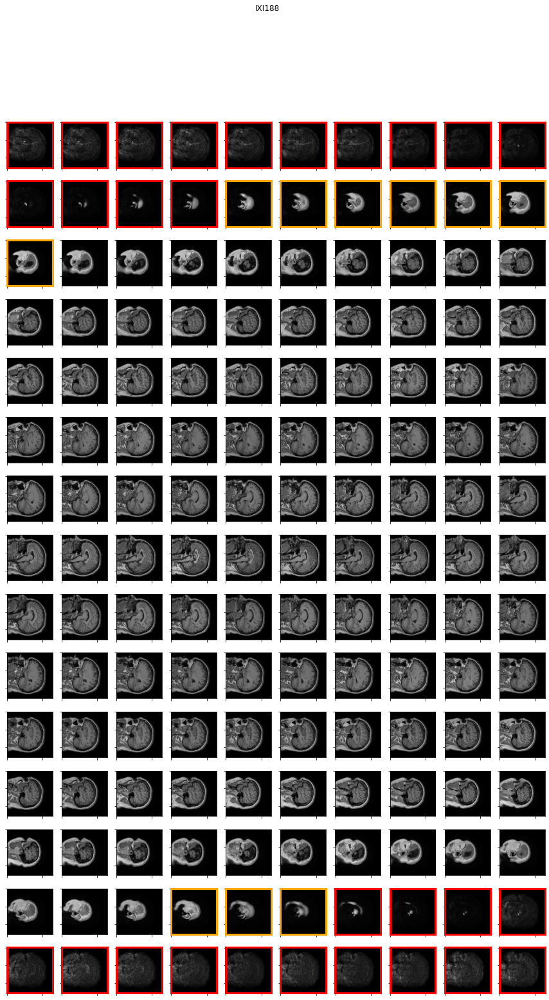

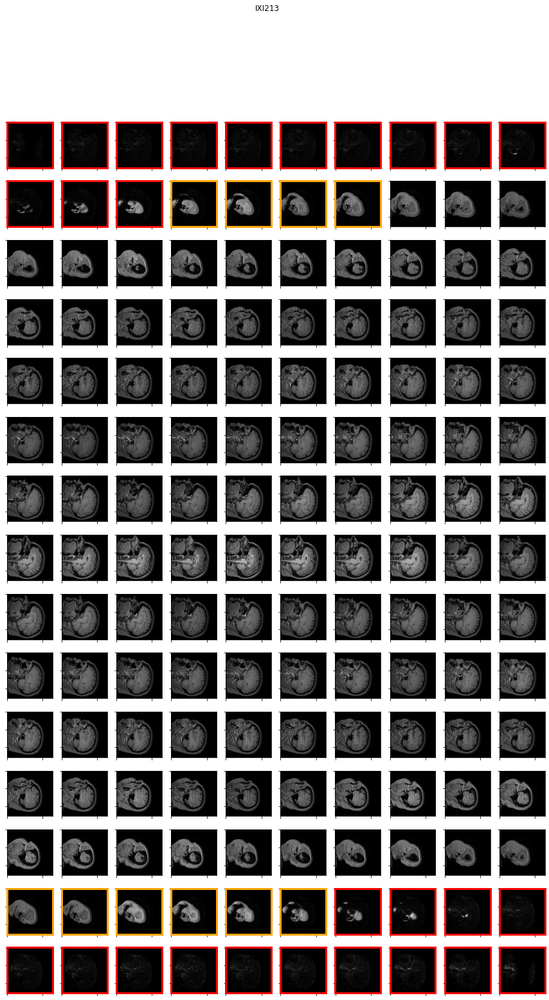

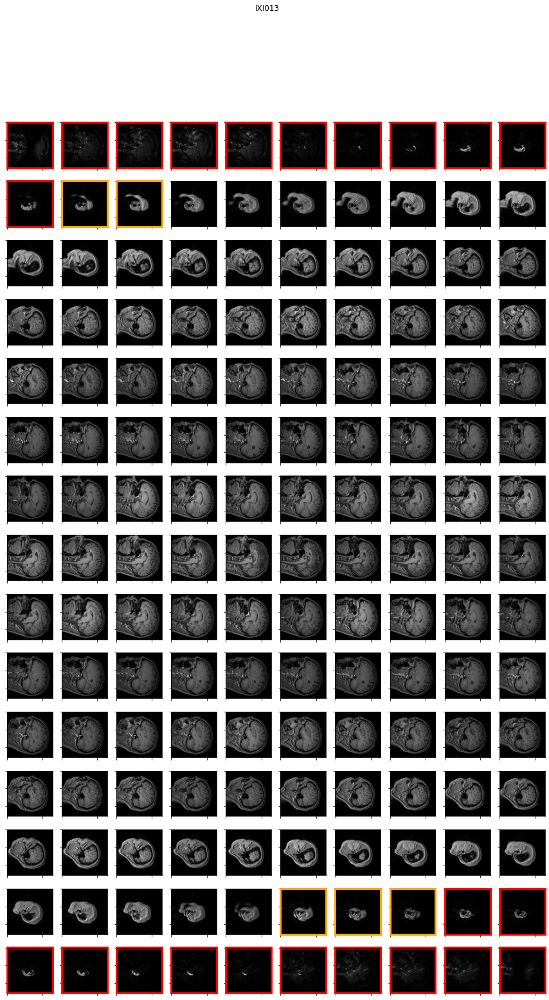

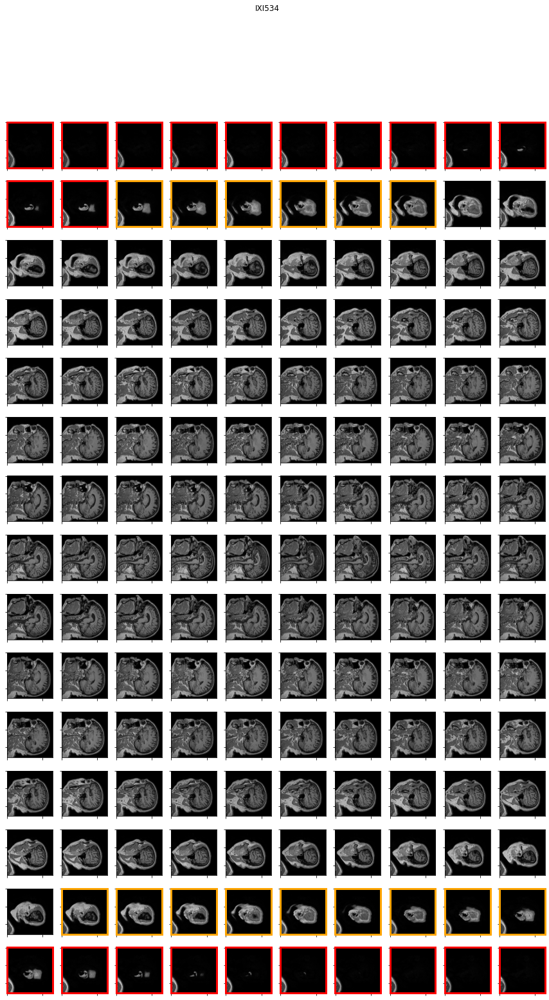

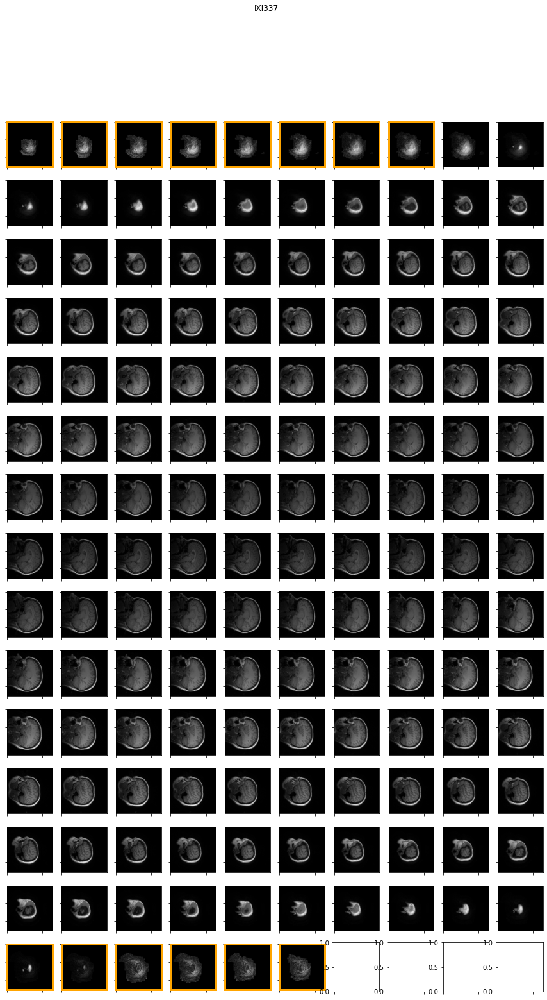

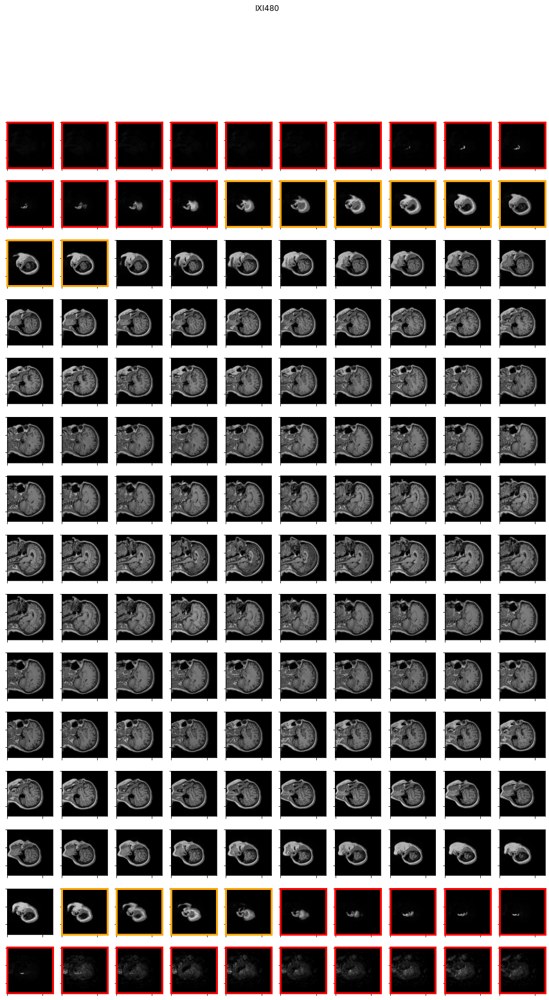

In [28]:
for f in random_vols:
    vol_np = nib.load(f).get_fdata()
    show_volume2(vol_np, f[10:16], df_nonzero_data['NONZERO_MEAN'].quantile(0.25), 50)

***We show the behaviour in the complicated volume***

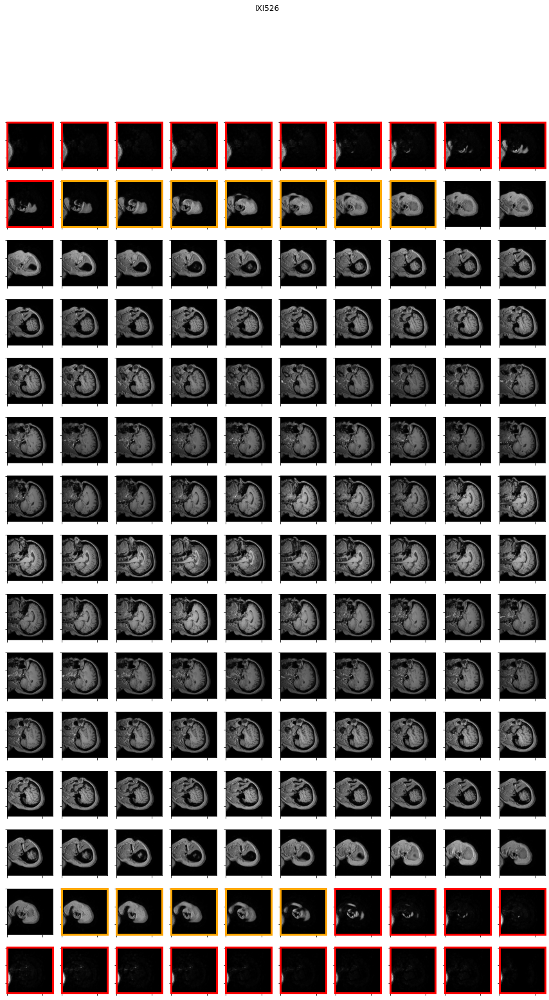

In [29]:
show_volume2(vol_526_np, 'IXI526', df_nonzero_data['NONZERO_MEAN'].quantile(0.25), 50)

*********************
***Adrián Arnaiz Rodríguez***